In [ ]:
!pip install -qq datasets
!pip install torcheval
!pip install torchview

In [ ]:
from datasets import load_dataset

dataset = load_dataset("eugenesiow/Div2k")

In [3]:
import torch
from torch.utils.data import Dataset, DataLoader
import cv2
import torchvision
from torchvision.transforms import v2
from tqdm import tqdm
from tabulate import tabulate
import torch
from torcheval.metrics import PeakSignalNoiseRatio

class MyDataset(Dataset):
  def __init__(self, split, transform_lr=None, transform_hr=None):

    self.split = split
    self.transform_lr = transform_lr
    self.transform_hr = transform_hr


  def __getitem__(self, index):
    
    
    lr = torchvision.io.read_image(self.split[index]['lr'])
    hr = torchvision.io.read_image(self.split[index]['hr'])
    
    if self.transform_lr is not None:
      lr =  self.transform_lr(lr)

    if self.transform_hr is not None:
      hr = self.transform_hr(hr)

    return lr, hr

  def __len__(self):
    return len(self.split)


def mean_std_channels(dataset_split, scale=True):

  mean_lr = 0
  std_lr = 0

  mean_hr = 0
  std_hr = 0

  for u in tqdm(dataset_split):

    lr = torchvision.io.read_image(u['lr']) / (255. if scale else 1)
    hr = torchvision.io.read_image(u['hr']) / (255. if scale else 1)


    mean_lr += torch.mean(lr,dim=(1, 2))
    std_lr += torch.std(lr, dim=(1, 2))


    mean_hr += torch.mean(hr,dim=(1, 2))
    std_hr += torch.std(hr, dim=(1, 2))

  return mean_lr/len(dataset_split),std_lr/len(dataset_split), \
         mean_hr/len(dataset_split),std_hr/len(dataset_split)





In [4]:
lr_tf = v2.Compose(
    
    [   v2.ToDtype(torch.float32, scale=True),
        v2.Resize((256,256),interpolation=torchvision.transforms.InterpolationMode.BILINEAR),
     ],
     

     )

hr_tf = v2.Compose(
    [v2.ToDtype(torch.float32, scale=True),
     v2.Resize((512,512)),
     
    ] )


train = MyDataset(dataset['train'], transform_lr=lr_tf, transform_hr=hr_tf)
valid = MyDataset(dataset['validation'],transform_lr=lr_tf, transform_hr=hr_tf)

In [5]:
import matplotlib.pyplot as plt
import numpy as np

def visualise(imgs, rows=2 , names='LR'):
    
    imgs = (imgs.transpose(1, 3))
    imgs = (imgs.transpose(2, 1))
    q = 0
    cols = len(imgs) // rows
    w, h = imgs.size()[1:3]
    imgs = imgs.detach().cpu().numpy()
    px = 1/plt.rcParams['figure.dpi']
    fig, ax = plt.subplots(figsize=(15,15 ) , nrows = rows, ncols = cols)


    for i in range(rows):
      for j in range(cols):
        ax[i][j].imshow(imgs[q]) if rows > 1 and cols > 1 else ax[q].imshow(imgs[q])
        ax[i][j].set_title(names) if rows > 1 and cols > 1 else ax[q].set_title(names)
        q+=1
        

    plt.show()

In [6]:
batch_size = 6
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


train_dataloader = DataLoader(train, batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(valid, batch_size=batch_size, shuffle=False)

/opt/conda/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


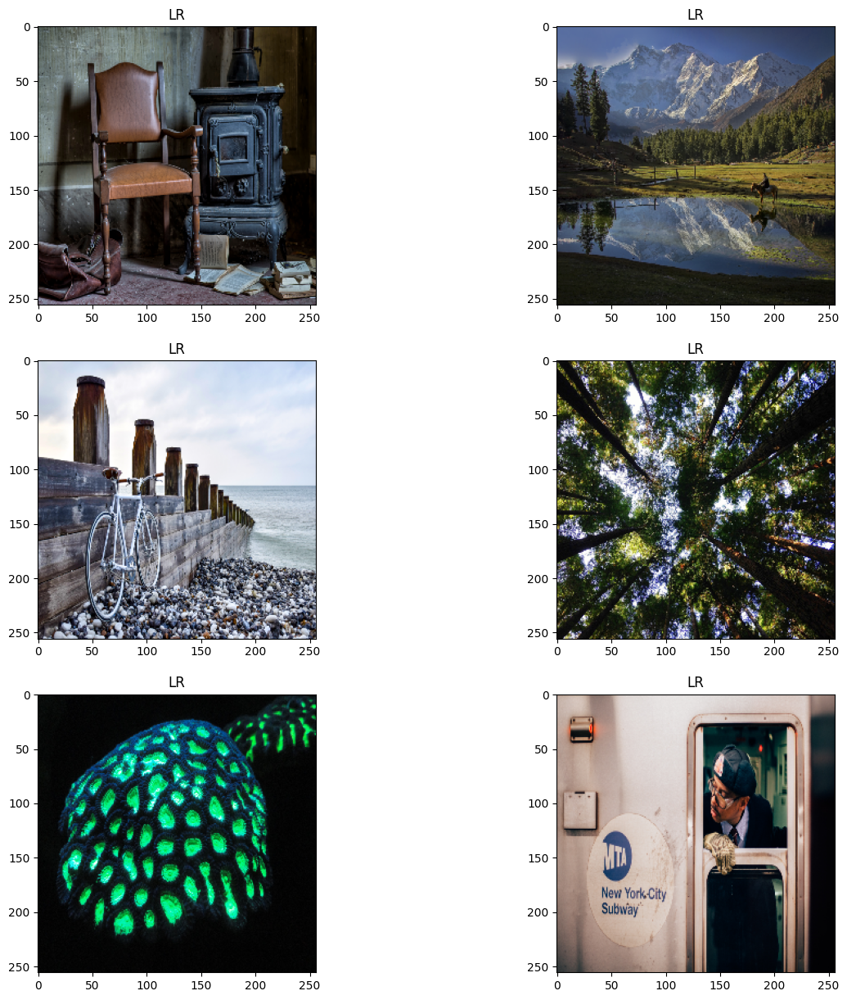

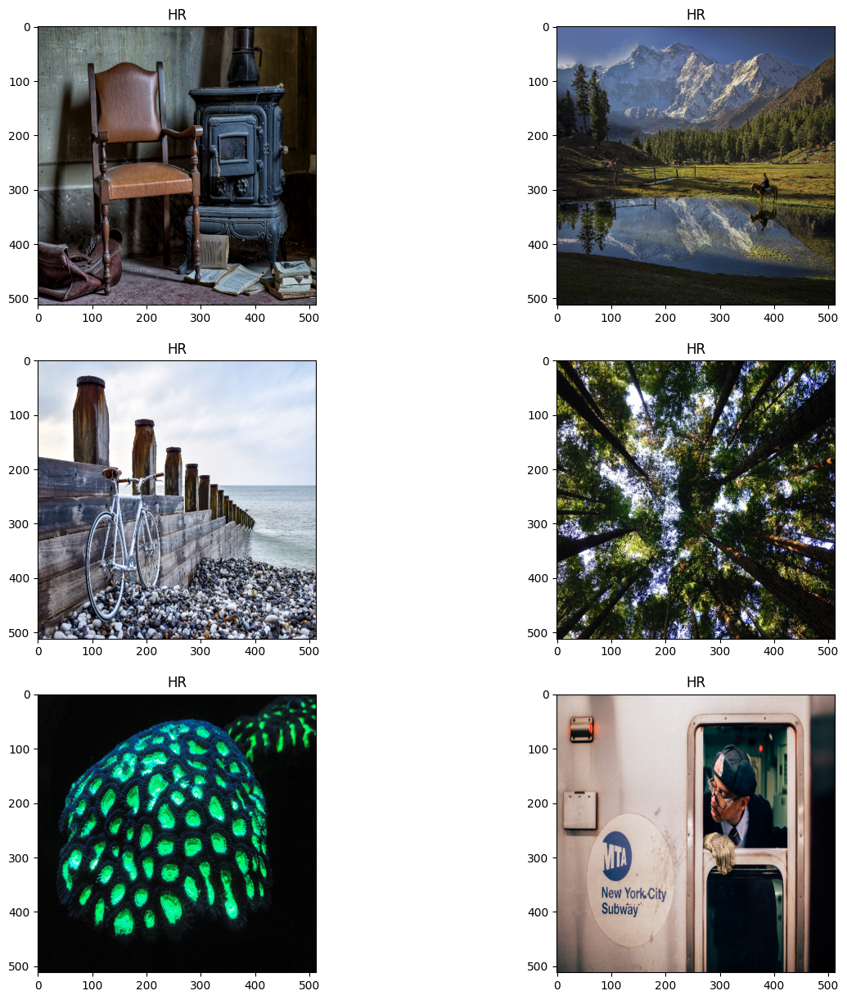

In [7]:
for x,y in train_dataloader:

  visualise(x, rows=3, names='LR')
  visualise(y, rows=3,names='HR')

  break

In [8]:
import torch
import torch.nn as nn
from collections import OrderedDict
from functools import partial


class AdaptiveResidual(nn.Module):
  def __init__(self,
               cin=3,
               cout=3,
               reverse=False,
               scale_param={'kernel_size':2,'stride':2,'padding':1},
               conv_param={'kernel_size':3,'stride':1,'padding':1,"bias":False},
               num_blocks=3,
               do_skip_connect=True,
               dropout_prob=0.5,
               do_scale=True,
               do_normalization=True,
               act_func=nn.ReLU(),
               ):
      super().__init__()


      self.do_skip_connect = do_skip_connect

      scale_param = scale_param if scale_param is not None else \
                                              {"kernel_size":3,
                                               "stride":2,
                                               "padding":0}

      conv_param = conv_param if conv_param is not None else \
                                              {"kernel_size":3,
                                               "stride":1,
                                               "padding":0,
                                               "bias":False}


      if reverse:
        conv = nn.ConvTranspose2d
        scale_func = nn.ConvTranspose2d(cout, cout, bias=False,
                                **scale_param) if do_scale else nn.Identity()


      else:
        conv = nn.Conv2d
        scale_func = nn.MaxPool2d(**scale_param) \
                                if do_scale else  nn.Identity()


      layers = [nn.Sequential(OrderedDict([
              ("conv", conv( in_channels=cin if i==0 else cout,
                             out_channels=cout,
                             **conv_param)
              ),
              ("bnorm", nn.BatchNorm2d(cout) if do_normalization else nn.Identity()),
              ("act", act_func),
              ("drop", nn.Dropout2d(dropout_prob))])

      ) for i in range(num_blocks)]

      self.layers = nn.Sequential(OrderedDict([(f"layer_{i}", layer) for i, layer
                                              in enumerate(layers)]))

      self.residual = nn.Identity() if cin==cout else \
                      conv(cin, cout, kernel_size=1)

      self.scale = nn.Sequential(OrderedDict([
          (f"{'scale' if do_scale else 'no scale'}", scale_func)]))

      self.stabilazation_size = partial(nn.Upsample)

  def forward(self, x):

    layers_end = self.layers(x)
    skip_connect_transform = self.residual(self.stabilazation_size(
                             size=layers_end.size()[2:])(x))

    return self.scale(layers_end + skip_connect_transform) if self.do_skip_connect \
           else self.scale(layers_end)



In [9]:
class AdaptiveShuffleResidual(nn.Module):
  def __init__(self,
               cin=3,
               cout=3,
               reverse=False,
               block_in_upscale=True,
               scale_param={'kernel_size':2,'stride':2,'padding':1},
               conv_param={'kernel_size':3,'stride':1,'padding':1,"bias":False},
               save_out_channels=True,
               pixel_shuffle_param= 2,
               num_blocks=3,
               do_skip_connect=True,
               dropout_prob=0.5,
               do_scale=True,
               do_normalization=True,
               act_func=nn.ReLU(),
               ):
      super().__init__()


      self.do_skip_connect = do_skip_connect
      

      scale_param = scale_param if scale_param is not None else \
                                              {"kernel_size":3,
                                               "stride":2,
                                               "padding":1}

      conv_param = conv_param if conv_param is not None else \
                                              {"kernel_size":1, "stride":1,
                                               "padding":0, "dilation":1,
                                               "groups":1,
                                               "bias":False,
                                               "padding_mode":'zeros',
                                               "device":None,
                                               "dtype":None}

      if block_in_upscale==True:

          pixel_shuffler = nn.PixelShuffle(pixel_shuffle_param) 
          c_out = (lambda i: cout if i==0 else cout // pixel_shuffle_param**(2*i))
          
      if block_in_upscale==False:
          
          pixel_shuffler = nn.PixelUnshuffle(pixel_shuffle_param)
          c_out = lambda i: cout if i==0 else cout * pixel_shuffle_param**(2*i)

        
      if block_in_upscale is None:
          pixel_shuffler = nn.Identity()
          c_out = (lambda i: cout)



      if reverse:
        conv = nn.ConvTranspose2d
        scale_func = nn.ConvTranspose2d(c_out(num_blocks), c_out(num_blocks), bias=False,
                                **scale_param) if do_scale else nn.Identity()

      else:
        conv = nn.Conv2d
        scale_func = nn.MaxPool2d(**scale_param) \
                                if do_scale else  nn.Identity()

        
        
      layers = [nn.Sequential(OrderedDict([
              ('conv', conv(in_channels = cin if i==0 else c_out(i),
                             out_channels=c_out(i),
                              **conv_param)
              ),
          
              ('pxshuffler',pixel_shuffler),
              ("bnorm", nn.BatchNorm2d(c_out(i+1)) if do_normalization else \
                        nn.Identity()),
              ("act", act_func),
              ("drop", nn.Dropout2d(dropout_prob))])

      ) for i in range(num_blocks)]
    
      
      self.save_cout = conv(c_out(num_blocks), c_out(0), kernel_size=1) if save_out_channels \
                       else nn.Identity()

      self.layers = nn.Sequential(OrderedDict([(f"layer_{i}", layer) for i, layer
                                              in enumerate(layers)]))

      self.residual = nn.Identity() if cin==c_out(num_blocks) else \
                      conv(c_out(num_blocks), c_out(0), kernel_size=1)

      self.endscale = nn.Sequential(OrderedDict([
          (f"{'scale' if do_scale else 'no scale'}", scale_func)]))


  def forward(self, x):

    return self.save_cout(self.endscale(self.layers(x) + self.residual(x))) if self.do_skip_connect \
           else self.save_cout(self.endscale(self.layers(x)))

In [10]:
class Encoder(nn.Module):
  def __init__(self,
               num_ada_res_block=3,
               hidden_channels_in_block=[3,32,64],
               depth_per_block = [1,1,1],
               conv_param=None,
               scale_param=None,
               act_func=[nn.ReLU()],
               dropout_ps=[0.5],
               do_normalization=[False],
               do_skip_connect=[False],
               do_scale_per_block=[True],
               fc_out_size=0
               ):

    super().__init__()

    def islist(arg, size):
      if isinstance(arg, list):

        if len(arg) < size:
          arg += [arg[-1]]*(size - len(arg))
        if len(arg) > size:
          arg = arg[:size]
        return arg
      else:
        return islist([arg], size)


    hidden_channels_per_block = islist(hidden_channels_in_block,
                                            num_ada_res_block + 1)

    depth_per_block = islist(depth_per_block, num_ada_res_block)
    conv_param = islist(conv_param, num_ada_res_block)
    scale_param = islist(scale_param, num_ada_res_block)
    act_func = islist(act_func, num_ada_res_block)
    dropout_ps = islist(dropout_ps, num_ada_res_block)
    do_skip_connect = islist(do_skip_connect, num_ada_res_block)
    do_scale_per_block = islist(do_scale_per_block, num_ada_res_block)
    do_normalization = islist(do_normalization, num_ada_res_block)
    
    
    self.encoder = nn.Sequential(OrderedDict(

      [(f'Residual Block {i}',AdaptiveResidual(cin=hidden_channels_per_block[i],
                                               cout=hidden_channels_per_block[i+1],
                                               reverse=False,
                                               scale_param=scale_param[i],
                                               conv_param=conv_param[i],
                                               num_blocks=depth_per_block[i],
                                               do_skip_connect=do_skip_connect[i],
                                               dropout_prob=dropout_ps[i],
                                               do_scale=do_scale_per_block[i],
                                               do_normalization = do_normalization[i],
                                               act_func=act_func[i])) for i in range(num_ada_res_block)] ))

    self.global_pool = nn.AdaptiveAvgPool2d(output_size=(1, 1)) if fc_out_size > 0 else nn.Identity()
    self.fc_layers = nn.Linear(hidden_channels_per_block[-1], fc_out_size) if fc_out_size > 0 else nn.Identity()

  def forward(self, x):


    x = self.encoder(x)
    x = self.global_pool(x).squeeze(-1).squeeze(-1) 
    return self.fc_layers(x)

In [11]:
class Decoder(nn.Module):
  def __init__(self,
               num_ada_res_block=3,
               hidden_channels_in_block=[3,3,3],
               depth_per_block = [1,1,1],
               conv_param=None,
               scale_param=None,
               act_func=[nn.ReLU()],
               do_normalization=False,
               dropout_ps=[0.5],
               do_skip_connect=[False],
               do_scale_per_block=[True],
               ):

    super().__init__()

    def islist(arg, size):
      if isinstance(arg, list):

        if len(arg) < size:
          arg += [arg[-1]]*(size - len(arg))
        if len(arg) > size:
          arg = arg[:size]
        return arg
      else:
        return islist([arg], size)


    hidden_channels_per_block = islist(hidden_channels_in_block,
                                            num_ada_res_block + 1)

    depth_per_block = islist(depth_per_block, num_ada_res_block)
    conv_param = islist(conv_param, num_ada_res_block)
    scale_param = islist(scale_param, num_ada_res_block)
    act_func = islist(act_func, num_ada_res_block)
    dropout_ps = islist(dropout_ps, num_ada_res_block)
    do_skip_connect = islist(do_skip_connect, num_ada_res_block)
    do_scale_per_block = islist(do_scale_per_block,num_ada_res_block)
    do_normalization = islist(do_normalization, num_ada_res_block)

    self.decoder = nn.Sequential(OrderedDict(

      [(f'Residual Block {i}',AdaptiveResidual(cin=hidden_channels_per_block[i],
                                               cout=hidden_channels_per_block[i+1],
                                               reverse=True,
                                               scale_param=scale_param[i],
                                               conv_param=conv_param[i],
                                               num_blocks=depth_per_block[i],
                                               do_skip_connect=do_skip_connect[i],
                                               dropout_prob=dropout_ps[i],
                                               do_scale=do_scale_per_block[i],
                                               do_normalization=do_normalization[i],
                                               act_func=act_func[i])) for i in range(num_ada_res_block)] ))


  def forward(self, x):

    return self.decoder(x)

In [12]:

class GenSR(nn.Module):
  def __init__(self,

               encoder_par,
               shuffle_par,
               ):
    super().__init__()
    
    self.prepare_conv = nn.Sequential(OrderedDict([
        ('conv', nn.Conv2d(in_channels=3,
                           out_channels=encoder_par['hidden_channels_in_block'][0],
                           kernel_size=9,
                           stride=1,
                           padding=0)),
        ('act', nn.PReLU())]))

    
    self.encoder = Encoder(**encoder_par)
    self.shuffler = AdaptiveShuffleResidual(**shuffle_par)
    self.endlayer = nn.Conv2d(in_channels=shuffle_par['cout'],
                              out_channels=3,kernel_size=9)
    
    self.conv_to_adapt = nn.Conv2d(in_channels=encoder_par['hidden_channels_in_block'][0],
                                  out_channels=encoder_par['hidden_channels_in_block'][-1],
                                  kernel_size=1)
    
    
  def forward(self, lr_image):
    
    prepare = self.prepare_conv(lr_image)
    x = self.encoder(prepare)
    resize_img = v2.Resize(x.size()[2:])(prepare)
    x = (x + resize_img)
    x = self.shuffler(x)
    x = self.endlayer(x)
    return x

class DisSR(nn.Module):
  def __init__(self, encoder_par):
    super().__init__()
    self.encoder = Encoder(**encoder_par)
    self.leaky = nn.LeakyReLU()
    self.dense = nn.Linear(in_features=encoder_par['fc_out_size'],out_features=1)
    self.sigma = nn.Sigmoid()

  def forward(self, x):

    x = self.encoder(x)
    x = self.leaky(x)
    x = self.dense(x)
    return self.sigma(x)

In [13]:

encoder_par_gen = dict(

               num_ada_res_block=5,
               hidden_channels_in_block=[64,64,64,64],
               depth_per_block = [2,2,2,1],
               conv_param=[{'kernel_size': 3, 'stride': 1,'padding':2,"bias":False},
                          {'kernel_size': 3, 'stride': 1,'padding':2,"bias":False},
                          {'kernel_size': 3, 'stride': 1,'padding':1,"bias":False},
                          {'kernel_size': 3, 'stride': 1,'padding':1,"bias":False}],
               scale_param=None,
               act_func=[nn.PReLU(),nn.PReLU(),nn.PReLU(),nn.Identity()],
               dropout_ps=[0],
               do_normalization=[True, True, True,False],
               do_skip_connect=[True, True, True,True],
               do_scale_per_block=[False],
               fc_out_size=0)

shuffle_par = dict(
               cin=64,
               cout=128,
               reverse=False,
               scale_param=None,
               conv_param={'kernel_size':3,'stride':1,'padding':3,"bias":False},
               block_in_upscale = True,
               save_out_channels = True,
               pixel_shuffle_param= 2,
               num_blocks=1,
               do_skip_connect=False,
               dropout_prob=0,
               do_scale=False,
               do_normalization=False,
               act_func=nn.PReLU()
)

encoder_param_dis = dict(

               num_ada_res_block=3,
               hidden_channels_in_block=[3,128,128],
               depth_per_block = [1],
               conv_param=[{'kernel_size': 3, 'stride': 2,"bias":False}],
               scale_param=None,
               act_func=[nn.LeakyReLU()],
               dropout_ps=[0, 0, 0],
               do_normalization=[False, True],
               do_skip_connect=[False],
               do_scale_per_block=[False],
               fc_out_size=512)

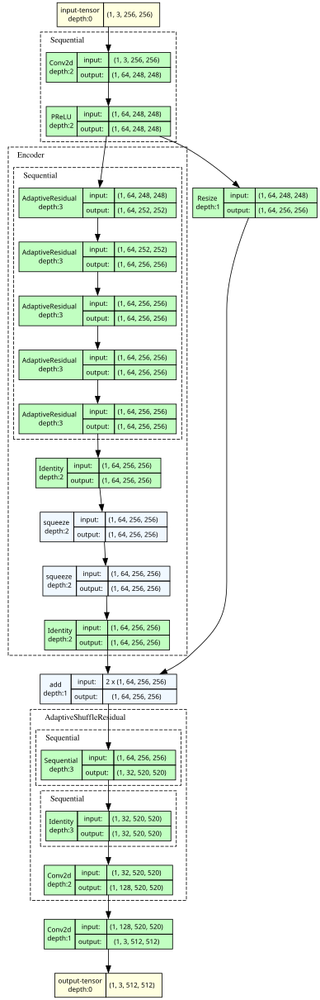

In [14]:
from torchview import draw_graph
torch.cuda.empty_cache()

model_graph = draw_graph(GenSR(**{'encoder_par':encoder_par_gen,'shuffle_par': shuffle_par}), input_size=(1,3,256,256), expand_nested=True)
model_graph.visual_graph

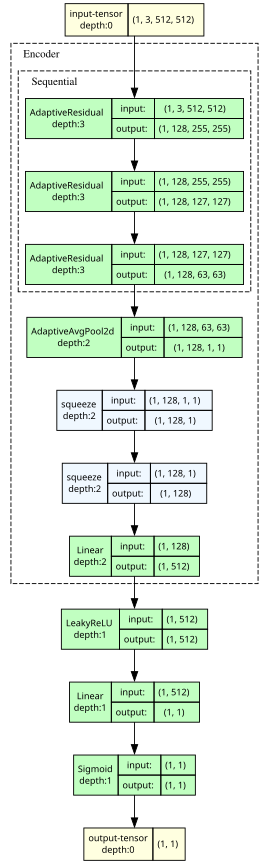

In [15]:
model_graph = draw_graph(DisSR(encoder_param_dis), input_size=(1,3,512,512), expand_nested=True)
model_graph.visual_graph

In [16]:
class ReconstructSRGan(nn.Module):
    def __init__(self, msepar):
        super().__init__()

        self.mse = nn.MSELoss(msepar) if msepar is not None \
                   else nn.MSELoss()

    def forward(self, x, y):
        return self.mse(x,y)

class AdversarialSRGan(nn.Module):
    def __init__(self, advsparam):
        super().__init__()

        self.logloss = nn.BCELoss(advsparam) if advsparam is not None \
                       else nn.BCELoss()

    def forward(self, x, y):
        return self.logloss(x, y)

class PixelLoss(nn.Module):
    def __init__(self, par):
        super().__init__()
        
        self.pixelloss = nn.L1Loss(par) if par is not None \
                         else nn.L1Loss()
    
    def forward(self, x, y):
        return self.pixelloss(x,y)


In [17]:

"""
def train_srgan(
           epochs=100,
           beta = 1e-3,
           visualise_every=25,
           device=device,
           train_dataloader=train_dataloader,
           valid_dataloader=valid_dataloader,
           gen_scheduler_par = {'gamma':0.9},
           diss_scheduler_par = {'gamma':0.9},
           scheduler_step = 20,
           rec_loss_param=None,
           advs_loss_param=None,
           gen_optim_param={'lr':0.001, "weight_decay":1/len(train_dataloader)},
           diss_optim_param={'lr':0.001 ,"weight_decay":1/len(train_dataloader) },
           gen_param={'encoder_par':encoder_par_gen,'shuffle_par': shuffle_par},
           diss_param=encoder_param_dis):

  generator = GenSR(**gen_param).to(device)
  discriminator = DisSR(encoder_param_dis).to(device)

  loss_reconsturct = ReconstructSRGan(rec_loss_param).to(device)
  loss_adversarial = AdversarialSRGan(advs_loss_param).to(device)


  gen_optim = optim.Adam(generator.parameters(), **gen_optim_param)
  diss_optim = optim.Adam(discriminator.parameters(), **diss_optim_param)
    
  gen_scheduler = optim.lr_scheduler.ExponentialLR(gen_optim, **gen_scheduler_par)
  diss_scheduler = optim.lr_scheduler.ExponentialLR(diss_optim, **diss_scheduler_par)

  gen_loss_avg = 0
  dis_loss_avg = 0
  total_batches = 0

  best_reconstruct = 1e10
    
  history = {}

  for ep in tqdm(range(epochs),desc="epochs"):


    generator.train()
    discriminator.train()
    for  (lr_img,hr_img) in train_dataloader:

        total_batches += 1

        lr_img = lr_img.to(device)
        hr_img = hr_img.to(device)


        sr_img = generator(lr_img)
        sr_img = v2.Resize(size=hr_img.size()[2:])(sr_img)

        sr_discriminated = discriminator(sr_img)

        content_loss = loss_reconsturct(sr_img, hr_img)
        adversarial_loss = loss_adversarial(sr_discriminated, torch.ones_like(sr_discriminated))
        perceptual_loss = content_loss + beta * adversarial_loss


        gen_optim.zero_grad()
        perceptual_loss.backward()
        gen_loss_avg += perceptual_loss.item()
        gen_optim.step()


        hr_discriminated = discriminator(hr_img)
        sr_discriminated = discriminator(sr_img.detach())

        adversarial_loss = loss_adversarial(sr_discriminated, torch.zeros_like(sr_discriminated)) + \
                           loss_adversarial(hr_discriminated, torch.ones_like(hr_discriminated))


        diss_optim.zero_grad()
        adversarial_loss.backward()
        dis_loss_avg += adversarial_loss
        diss_optim.step()
    
    if (ep + 1) % visualise_every == 0:
                
        visualise(lr_img, rows=2, names='LR')
        visualise(sr_img, rows=2, names='SR')
        
        cv2.imwrite(f'./lr_epochs{ep +1}.jpg',np.transpose(lr_img[0].cpu().detach().numpy(),(1,2,0)))
        cv2.imwrite(f'./hr_epochs{ep +1}.jpg',np.transpose(hr_img[0].cpu().detach().numpy(),(1,2,0)))
        cv2.imwrite(f'./sr_epochs{ep +1}.jpg',np.transpose(sr_img[0].cpu().detach().numpy(),(1,2,0)))
        
    generator.eval()
    valid_loss = 0
    with torch.no_grad():
        for lr, hr in valid_dataloader:

              lr = lr.to(device)
              hr = hr.to(device)
              sr_valid = generator(lr)
                
              sr = v2.Resize(size=hr.size()[2:])(sr_valid)
              reconstruct = loss_reconsturct(sr, hr)
        
              valid_loss +=reconstruct.item()"""
            



SyntaxError: unterminated string literal (detected at line 133) (1967061992.py, line 133)

In [25]:
import torch.optim as optim

def train_srgan(
           epochs=100,
           alpha= 0.9,
           beta = 1e-3,
           save_every=25,
           device=device,
           train_dataloader=train_dataloader,
           valid_dataloader=valid_dataloader,
           gen_scheduler_par = {'gamma':0.9},
           diss_scheduler_par = {'gamma':0.9},
           scheduler_step = 1,
           rec_loss_param=None,
           advs_loss_param=None,
           pix_loss=None,
           gen_optim_param={'lr':0.001, "weight_decay":1/len(train_dataloader)},
           diss_optim_param={'lr':0.00001 ,"weight_decay":5/len(train_dataloader) },
           gen_param={'encoder_par':encoder_par_gen,'shuffle_par': shuffle_par},
           diss_param=encoder_param_dis):

    generator = GenSR(**gen_param).to(device)
    discriminator = DisSR(diss_param).to(device)
    
    loss_reconsturct = ReconstructSRGan(rec_loss_param).to(device)
    loss_adversarial = AdversarialSRGan(advs_loss_param).to(device)
    pixel_loss = PixelLoss(pix_loss).to(device)


    gen_optim = optim.Adam(generator.parameters(), **gen_optim_param)
    disc_optim = optim.Adam(discriminator.parameters(), **diss_optim_param)
    
    gen_scheduler = optim.lr_scheduler.ExponentialLR(gen_optim, **gen_scheduler_par)
    disc_scheduler = optim.lr_scheduler.ExponentialLR(disc_optim, **diss_scheduler_par)


    total_batches = 0
  
    metric = PeakSignalNoiseRatio()
  
    history = {}
  
    
    for ep in tqdm(range(epochs),desc="epochs"):


        generator.train()
        discriminator.train()
        
        gen_loss_avg = 0
        disc_loss_avg = 0
        total_batches_train = 0

        
        print('\n')
        print(f'Epochs [{ep + 1}/ {epochs}] \n')
        for  (lr_imgs,hr_imgs) in train_dataloader:
            
            total_batches_train += 1
            
        
            lr_imgs = lr_imgs.to(device)
            hr_imgs = hr_imgs.to(device)
        
            gen_optim.zero_grad()
            
            sr_imgs = generator(lr_imgs)
            sr_discriminated = discriminator(sr_imgs)
            
            mse = loss_reconsturct(hr_imgs, sr_imgs)
            px_loss = pixel_loss(hr_imgs, sr_imgs)
            adv_gen_loss = loss_adversarial(sr_discriminated, torch.ones_like(sr_discriminated))
            
            sr_loss = mse + alpha*px_loss + beta*adv_gen_loss
            gen_loss_avg += sr_loss.item()    
            sr_loss.backward()
        
            gen_optim.step()
        
        
            disc_optim.zero_grad()
        
            hr_discriminated = discriminator(hr_imgs)
            sr_discriminated = discriminator(sr_imgs.detach())
        
            discriminated_loss = loss_adversarial(hr_discriminated,torch.ones_like(hr_discriminated)) + \
                             loss_adversarial(sr_discriminated,torch.zeros_like(sr_discriminated))
            
            discriminated_loss.backward()
            disc_loss_avg += discriminated_loss.item()
            
            disc_optim.step()
            
            psnr_train = metric.update(sr_imgs, hr_imgs)
        
        
        psnr_train = metric.compute()
        generator.eval()
        with torch.no_grad():
            for lr_valid, hr_valid in valid_dataloader:
                
                lr_valid = lr_valid.to(device)
                hr_valid = hr_valid.to(device)
                sr_valid = generator(lr_valid)
                
                psnr_valid = metric.update(sr_valid, hr_valid)
        
        psnr_valid = metric.compute()
            
        if (ep + 1) % save_every == 0:
                
            visualise(lr_imgs, rows=2, names='LR')
            visualise(sr_imgs, rows=2, names='SR')
            visualise(sr_valid, rows=2, names='valid SR')
        
            cv2.imwrite(f'./lr_epochs{ep +1}.jpg',np.transpose(lr_imgs[0].cpu().detach().numpy(),(1,2,0)))
            cv2.imwrite(f'./hr_epochs{ep +1}.jpg',np.transpose(hr_imgs[0].cpu().detach().numpy(),(1,2,0)))
            cv2.imwrite(f'./sr_epochs{ep +1}.jpg',np.transpose(sr_imgs[0].cpu().detach().numpy(),(1,2,0)))

            cv2.imwrite(f'./lr_valid_epochs{ep +1}.jpg',np.transpose(lr_valid[0].cpu().detach().numpy(),(1,2,0)))
            cv2.imwrite(f'./hr_valid_epochs{ep +1}.jpg',np.transpose(hr_valid[0].cpu().detach().numpy(),(1,2,0)))
            cv2.imwrite(f'./sr_valid_epochs{ep +1}.jpg',np.transpose(sr_valid[0].cpu().detach().numpy(),(1,2,0)))
            
            torch.save(generator.state_dict(),'./gen_state.pth')
            torch.save(discriminator.state_dict(),'./dis_state.pth')
            
        if (ep +1) % scheduler_step == 0 :
            gen_scheduler.step()
            disc_scheduler.step()
        
        
        history['Gen Loss Train'] = gen_loss_avg / total_batches_train
        history['Discriminator Loss'] = disc_loss_avg / total_batches_train
        history['PSNR train'] = psnr_train
        history['PSNR valid'] = psnr_valid
        history['Diss lr'] = disc_optim.state_dict()['param_groups'][0]['lr']
        history['Gen lr'] = gen_optim.state_dict()['param_groups'][0]['lr']
        

        print(tabulate([history], headers='keys', tablefmt='github'))


In [26]:
torch.cuda.empty_cache()

epochs:   0%|          | 0/100 [00:00<?, ?it/s]



Epochs [1/ 100] 



epochs:   1%|          | 1/100 [03:16<5:23:30, 196.07s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|         0.222398 |              1.24196 |      10.9229 |      11.2806 |     0.001 |    0.001 |


Epochs [2/ 100] 



epochs:   2%|▏         | 2/100 [06:32<5:20:29, 196.22s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|          0.05293 |             0.538784 |      13.2537 |      13.3663 |     0.001 |    0.001 |


Epochs [3/ 100] 



epochs:   3%|▎         | 3/100 [09:47<5:16:17, 195.64s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|        0.0336285 |             0.203254 |      14.3687 |      14.4421 |     0.001 |    0.001 |


Epochs [4/ 100] 



epochs:   4%|▍         | 4/100 [13:03<5:13:12, 195.75s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|        0.0217838 |             0.127305 |      15.1574 |      15.2316 |     0.001 |    0.001 |


Epochs [5/ 100] 



epochs:   5%|▌         | 5/100 [16:19<5:10:08, 195.88s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|        0.0155521 |             0.097051 |      15.7873 |      15.8371 |     0.001 |    0.001 |


Epochs [6/ 100] 



epochs:   6%|▌         | 6/100 [19:35<5:07:16, 196.13s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|        0.0119371 |            0.0496417 |      16.2907 |      16.3272 |     0.001 |    0.001 |


Epochs [7/ 100] 



epochs:   7%|▋         | 7/100 [22:51<5:03:29, 195.80s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|         0.010917 |            0.0602809 |       16.663 |      16.6979 |     0.001 |    0.001 |


Epochs [8/ 100] 



epochs:   8%|▊         | 8/100 [26:05<4:59:20, 195.22s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00881789 |            0.0268241 |       16.998 |      17.0273 |     0.001 |    0.001 |


Epochs [9/ 100] 



epochs:   9%|▉         | 9/100 [29:21<4:56:44, 195.65s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00816042 |            0.0140684 |      17.2697 |      17.2969 |     0.001 |    0.001 |


Epochs [10/ 100] 



epochs:  10%|█         | 10/100 [32:38<4:53:56, 195.97s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|        0.0066659 |           0.00516916 |      17.5268 |      17.5533 |     0.001 |    0.001 |


Epochs [11/ 100] 



epochs:  11%|█         | 11/100 [35:53<4:50:12, 195.65s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|        0.0060465 |           0.00466831 |      17.7524 |      17.7736 |     0.001 |    0.001 |


Epochs [12/ 100] 



epochs:  12%|█▏        | 12/100 [39:10<4:47:38, 196.12s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00578945 |           0.00128148 |      17.9418 |      17.9583 |     0.001 |    0.001 |


Epochs [13/ 100] 



epochs:  13%|█▎        | 13/100 [42:27<4:44:35, 196.28s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00496038 |            0.0557569 |       18.111 |      18.1273 |     0.001 |    0.001 |


Epochs [14/ 100] 



epochs:  14%|█▍        | 14/100 [45:43<4:41:10, 196.17s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00462362 |            0.0167727 |      18.2653 |      18.2813 |     0.001 |    0.001 |


Epochs [15/ 100] 



epochs:  15%|█▌        | 15/100 [49:02<4:39:17, 197.15s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|        0.0042725 |           0.00645686 |      18.4083 |      18.4219 |     0.001 |    0.001 |


Epochs [16/ 100] 



epochs:  16%|█▌        | 16/100 [52:17<4:35:11, 196.57s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00417379 |            0.0164517 |      18.5296 |      18.5415 |     0.001 |    0.001 |


Epochs [17/ 100] 



epochs:  17%|█▋        | 17/100 [55:33<4:31:32, 196.30s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00399332 |           0.00138188 |      18.6387 |      18.6476 |     0.001 |    0.001 |


Epochs [18/ 100] 



epochs:  18%|█▊        | 18/100 [58:48<4:27:51, 195.99s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00359176 |           0.00341931 |      18.7436 |      18.7523 |     0.001 |    0.001 |


Epochs [19/ 100] 



epochs:  19%|█▉        | 19/100 [1:02:04<4:24:22, 195.83s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00334283 |           0.00680337 |      18.8407 |      18.8473 |     0.001 |    0.001 |


Epochs [20/ 100] 



epochs:  20%|██        | 20/100 [1:05:19<4:20:52, 195.66s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00324211 |           0.00183369 |      18.9285 |       18.928 |    0.0009 |   0.0009 |


Epochs [21/ 100] 



epochs:  21%|██        | 21/100 [1:08:34<4:17:36, 195.66s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00300063 |           0.00698655 |      19.0053 |      19.0045 |    0.0009 |   0.0009 |


Epochs [22/ 100] 



epochs:  22%|██▏       | 22/100 [1:11:52<4:15:05, 196.23s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00286447 |           0.00090887 |      19.0782 |      19.0767 |    0.0009 |   0.0009 |


Epochs [23/ 100] 



epochs:  23%|██▎       | 23/100 [1:15:12<4:13:13, 197.32s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00284171 |           0.00600211 |      19.1391 |      19.1473 |    0.0009 |   0.0009 |


Epochs [24/ 100] 



epochs:  24%|██▍       | 24/100 [1:18:29<4:09:40, 197.11s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00277059 |           0.00507381 |       19.203 |      19.2075 |    0.0009 |   0.0009 |


Epochs [25/ 100] 



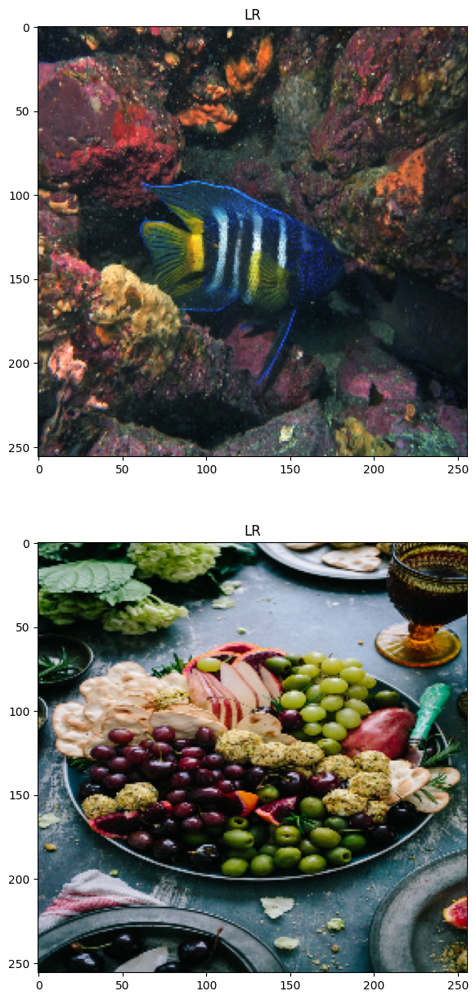

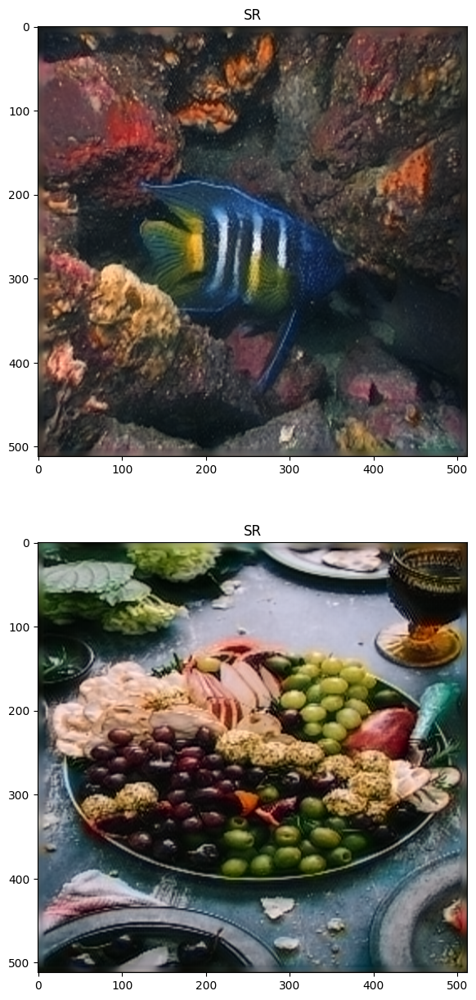

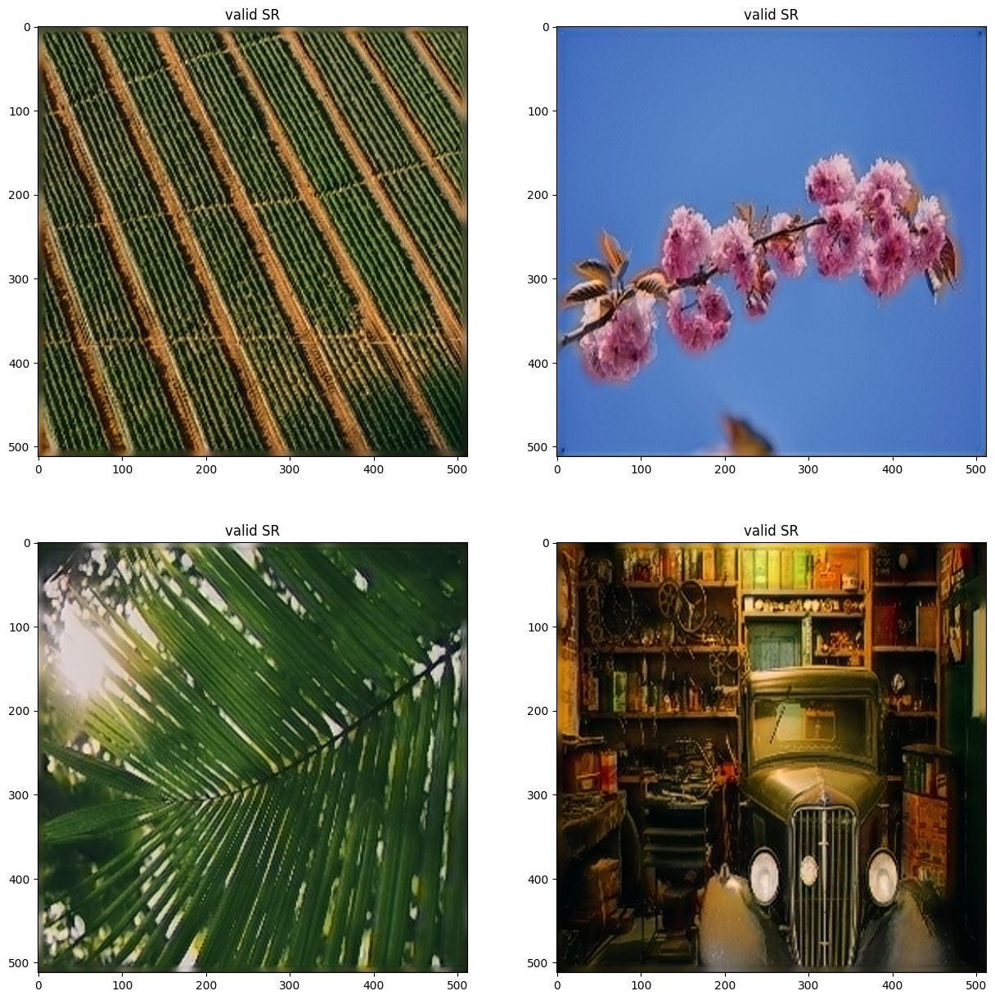

epochs:  25%|██▌       | 25/100 [1:21:48<4:07:11, 197.75s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00254278 |           0.00853267 |      19.2645 |      19.2668 |    0.0009 |   0.0009 |


Epochs [26/ 100] 



epochs:  26%|██▌       | 26/100 [1:25:05<4:03:47, 197.67s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00242822 |            0.0155515 |      19.3182 |      19.3241 |    0.0009 |   0.0009 |


Epochs [27/ 100] 



epochs:  27%|██▋       | 27/100 [1:28:21<3:59:50, 197.12s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00235846 |            0.0169423 |       19.371 |      19.3757 |    0.0009 |   0.0009 |


Epochs [28/ 100] 



epochs:  28%|██▊       | 28/100 [1:31:38<3:56:23, 196.99s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00223989 |             0.013358 |       19.422 |      19.4264 |    0.0009 |   0.0009 |


Epochs [29/ 100] 



epochs:  29%|██▉       | 29/100 [1:34:55<3:53:17, 197.14s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00216991 |            0.0131606 |      19.4694 |      19.4653 |    0.0009 |   0.0009 |


Epochs [30/ 100] 



epochs:  30%|███       | 30/100 [1:38:11<3:49:35, 196.80s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00207774 |           0.00869633 |      19.5086 |      19.5129 |    0.0009 |   0.0009 |


Epochs [31/ 100] 



epochs:  31%|███       | 31/100 [1:41:25<3:45:23, 196.00s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00196965 |            0.0056945 |      19.5559 |      19.5597 |    0.0009 |   0.0009 |


Epochs [32/ 100] 



epochs:  32%|███▏      | 32/100 [1:44:44<3:43:08, 196.89s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00193398 |            0.0135326 |      19.5972 |       19.596 |    0.0009 |   0.0009 |


Epochs [33/ 100] 



epochs:  33%|███▎      | 33/100 [1:48:03<3:40:26, 197.42s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00184688 |           0.00676221 |      19.6336 |      19.6366 |    0.0009 |   0.0009 |


Epochs [34/ 100] 



epochs:  34%|███▍      | 34/100 [1:51:20<3:37:02, 197.31s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00180109 |           0.00185268 |      19.6742 |      19.6682 |    0.0009 |   0.0009 |


Epochs [35/ 100] 



epochs:  35%|███▌      | 35/100 [1:54:37<3:33:41, 197.26s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00185745 |           0.00567834 |      19.6968 |      19.6991 |    0.0009 |   0.0009 |


Epochs [36/ 100] 



epochs:  36%|███▌      | 36/100 [1:57:52<3:29:40, 196.57s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00176213 |           0.00319217 |      19.7306 |      19.7317 |    0.0009 |   0.0009 |


Epochs [37/ 100] 



epochs:  37%|███▋      | 37/100 [2:01:07<3:25:59, 196.18s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00166915 |          0.000251888 |      19.7664 |      19.7699 |    0.0009 |   0.0009 |


Epochs [38/ 100] 



epochs:  38%|███▊      | 38/100 [2:04:23<3:22:39, 196.13s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00166697 |          0.000265054 |       19.801 |      19.7984 |    0.0009 |   0.0009 |


Epochs [39/ 100] 



epochs:  39%|███▉      | 39/100 [2:07:42<3:20:10, 196.89s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00156979 |          0.000307554 |      19.8311 |      19.8324 |    0.0009 |   0.0009 |


Epochs [40/ 100] 



epochs:  40%|████      | 40/100 [2:11:00<3:17:02, 197.04s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00155391 |          0.000323864 |      19.8622 |      19.8657 |   0.00081 |  0.00081 |


Epochs [41/ 100] 



epochs:  41%|████      | 41/100 [2:14:16<3:13:28, 196.75s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00149958 |          0.000314762 |      19.8952 |      19.8955 |   0.00081 |  0.00081 |


Epochs [42/ 100] 



epochs:  42%|████▏     | 42/100 [2:17:32<3:10:00, 196.57s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00142921 |          0.000320827 |      19.9253 |      19.9282 |   0.00081 |  0.00081 |


Epochs [43/ 100] 



epochs:  43%|████▎     | 43/100 [2:20:50<3:07:11, 197.05s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|        0.0014244 |          0.000304465 |      19.9557 |      19.9572 |   0.00081 |  0.00081 |


Epochs [44/ 100] 



epochs:  44%|████▍     | 44/100 [2:24:07<3:03:53, 197.02s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00139358 |          0.000308051 |      19.9836 |      19.9836 |   0.00081 |  0.00081 |


Epochs [45/ 100] 



epochs:  45%|████▌     | 45/100 [2:27:25<3:00:50, 197.29s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00133851 |          0.000288219 |      20.0099 |      20.0115 |   0.00081 |  0.00081 |


Epochs [46/ 100] 



epochs:  46%|████▌     | 46/100 [2:30:43<2:57:52, 197.64s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00129987 |          0.000307926 |      20.0373 |      20.0369 |   0.00081 |  0.00081 |


Epochs [47/ 100] 



epochs:  47%|████▋     | 47/100 [2:34:00<2:54:18, 197.33s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00127972 |          0.000290881 |      20.0615 |       20.064 |   0.00081 |  0.00081 |


Epochs [48/ 100] 



epochs:  48%|████▊     | 48/100 [2:37:17<2:51:01, 197.35s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00128659 |          0.000287208 |       20.086 |      20.0885 |   0.00081 |  0.00081 |


Epochs [49/ 100] 



epochs:  49%|████▉     | 49/100 [2:40:35<2:47:49, 197.44s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00123176 |          0.000529761 |      20.1111 |      20.1109 |   0.00081 |  0.00081 |


Epochs [50/ 100] 



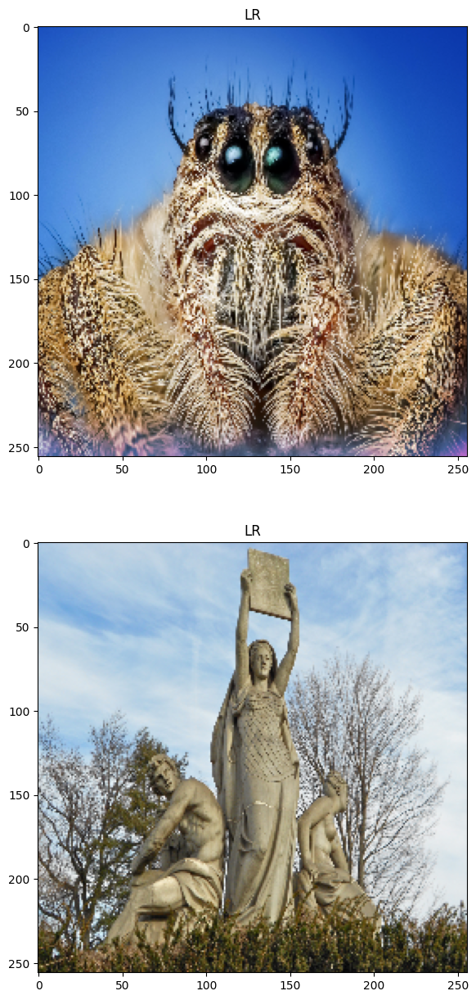

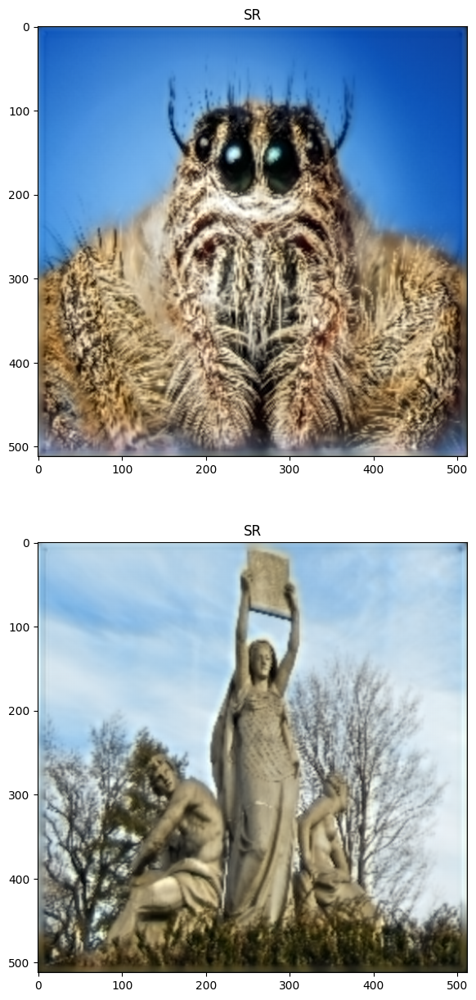

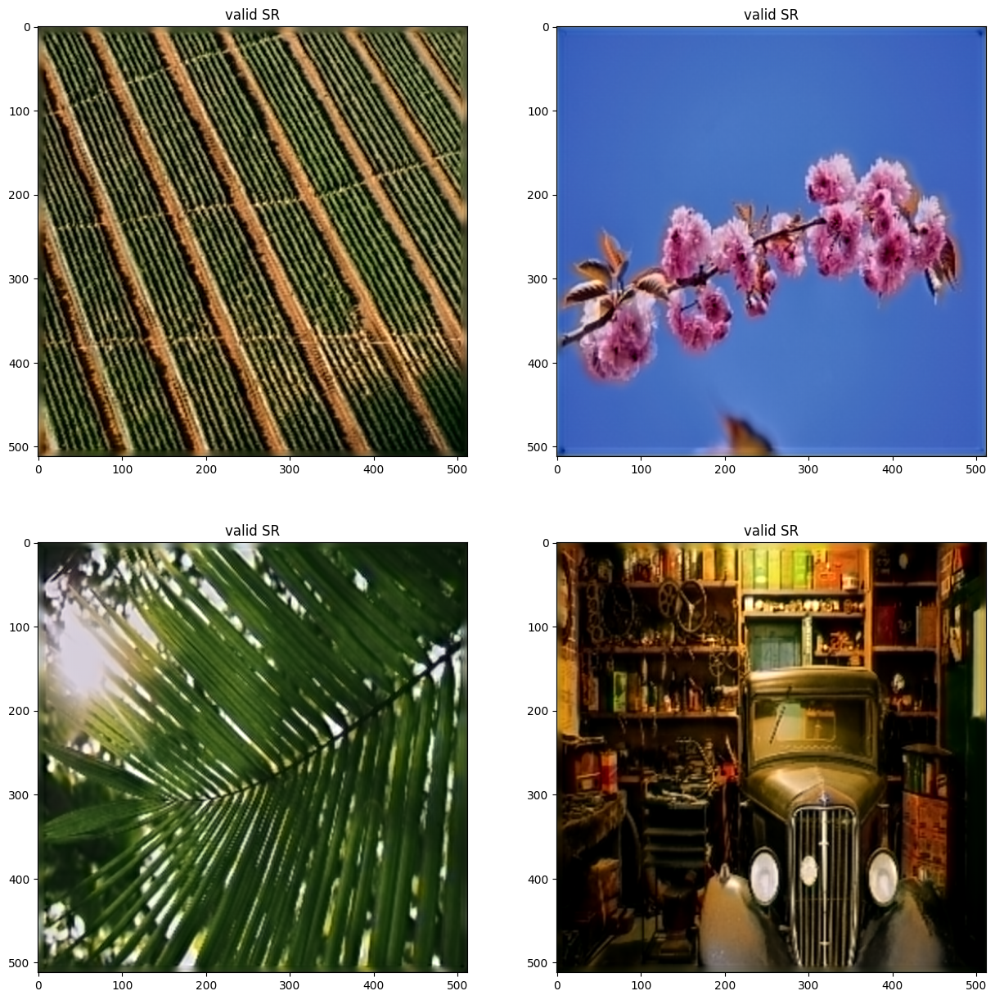

epochs:  50%|█████     | 50/100 [2:43:55<2:45:09, 198.18s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00119929 |           0.00360611 |      20.1315 |      20.1318 |   0.00081 |  0.00081 |


Epochs [51/ 100] 



epochs:  51%|█████     | 51/100 [2:47:14<2:42:02, 198.41s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|        0.0011623 |           0.00542208 |      20.1508 |      20.1531 |   0.00081 |  0.00081 |


Epochs [52/ 100] 



epochs:  52%|█████▏    | 52/100 [2:50:32<2:38:48, 198.51s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00118748 |           0.00635651 |      20.1685 |      20.1704 |   0.00081 |  0.00081 |


Epochs [53/ 100] 



epochs:  53%|█████▎    | 53/100 [2:53:50<2:35:19, 198.29s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00113981 |           0.00107611 |      20.1895 |      20.1884 |   0.00081 |  0.00081 |


Epochs [54/ 100] 



epochs:  54%|█████▍    | 54/100 [2:57:10<2:32:18, 198.66s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|        0.0011378 |          0.000233751 |      20.2068 |      20.2074 |   0.00081 |  0.00081 |


Epochs [55/ 100] 



epochs:  55%|█████▌    | 55/100 [3:00:28<2:28:47, 198.39s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|         0.001074 |          0.000226968 |      20.2275 |       20.228 |   0.00081 |  0.00081 |


Epochs [56/ 100] 



epochs:  56%|█████▌    | 56/100 [3:03:47<2:25:48, 198.83s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00110126 |           0.00023802 |      20.2449 |      20.2457 |   0.00081 |  0.00081 |


Epochs [57/ 100] 



epochs:  57%|█████▋    | 57/100 [3:07:03<2:21:48, 197.87s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00106333 |          0.000246321 |      20.2632 |      20.2646 |   0.00081 |  0.00081 |


Epochs [58/ 100] 



epochs:  58%|█████▊    | 58/100 [3:10:20<2:18:18, 197.58s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00104776 |          0.000243376 |      20.2817 |      20.2824 |   0.00081 |  0.00081 |


Epochs [59/ 100] 



epochs:  59%|█████▉    | 59/100 [3:13:35<2:14:34, 196.93s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00102963 |          0.000235768 |       20.299 |      20.2993 |   0.00081 |  0.00081 |


Epochs [60/ 100] 



epochs:  60%|██████    | 60/100 [3:16:52<2:11:08, 196.71s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000994771 |          0.000411393 |      20.3158 |      20.3171 |  0.000729 | 0.000729 |


Epochs [61/ 100] 



epochs:  61%|██████    | 61/100 [3:20:08<2:07:47, 196.60s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000982618 |          0.000536405 |      20.3327 |      20.3339 |  0.000729 | 0.000729 |


Epochs [62/ 100] 



epochs:  62%|██████▏   | 62/100 [3:23:27<2:05:01, 197.40s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00095456 |          0.000185281 |      20.3503 |      20.3464 |  0.000729 | 0.000729 |


Epochs [63/ 100] 



epochs:  63%|██████▎   | 63/100 [3:26:46<2:01:56, 197.73s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000926649 |          0.000214213 |      20.3629 |      20.3628 |  0.000729 | 0.000729 |


Epochs [64/ 100] 



epochs:  64%|██████▍   | 64/100 [3:30:03<1:58:34, 197.62s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00091541 |          0.000216467 |      20.3789 |      20.3797 |  0.000729 | 0.000729 |


Epochs [65/ 100] 



epochs:  65%|██████▌   | 65/100 [3:33:21<1:55:23, 197.83s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000923711 |          0.000216673 |      20.3941 |      20.3955 |  0.000729 | 0.000729 |


Epochs [66/ 100] 



epochs:  66%|██████▌   | 66/100 [3:36:38<1:51:56, 197.55s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00091495 |           0.00021573 |      20.4094 |      20.4109 |  0.000729 | 0.000729 |


Epochs [67/ 100] 



epochs:  67%|██████▋   | 67/100 [3:39:57<1:48:52, 197.94s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00089318 |          0.000210582 |      20.4248 |      20.4249 |  0.000729 | 0.000729 |


Epochs [68/ 100] 



epochs:  68%|██████▊   | 68/100 [3:43:16<1:45:41, 198.19s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000861151 |          0.000218254 |      20.4393 |      20.4397 |  0.000729 | 0.000729 |


Epochs [69/ 100] 



epochs:  69%|██████▉   | 69/100 [3:46:33<1:42:16, 197.96s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000868424 |          0.000200563 |      20.4528 |      20.4538 |  0.000729 | 0.000729 |


Epochs [70/ 100] 



epochs:  70%|███████   | 70/100 [3:49:51<1:38:58, 197.94s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000843982 |          0.000202506 |      20.4671 |      20.4685 |  0.000729 | 0.000729 |


Epochs [71/ 100] 



epochs:  71%|███████   | 71/100 [3:53:09<1:35:43, 198.05s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000822816 |          0.000269132 |      20.4821 |      20.4821 |  0.000729 | 0.000729 |


Epochs [72/ 100] 



epochs:  72%|███████▏  | 72/100 [3:56:26<1:32:15, 197.70s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000831794 |          0.000193496 |      20.4942 |      20.4938 |  0.000729 | 0.000729 |


Epochs [73/ 100] 



epochs:  73%|███████▎  | 73/100 [3:59:45<1:29:04, 197.94s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000829723 |          0.000201342 |      20.5051 |      20.5052 |  0.000729 | 0.000729 |


Epochs [74/ 100] 



epochs:  74%|███████▍  | 74/100 [4:03:02<1:25:37, 197.60s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000804246 |          0.000200036 |      20.5169 |      20.5182 |  0.000729 | 0.000729 |


Epochs [75/ 100] 



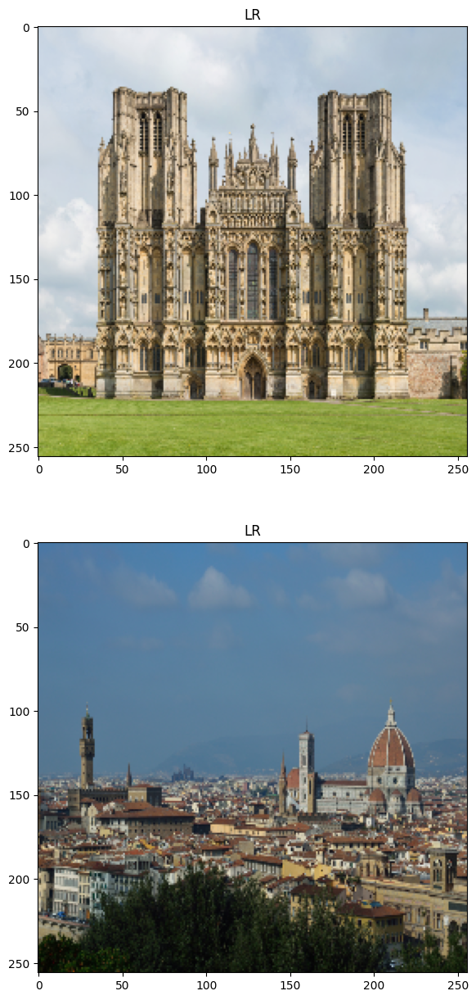

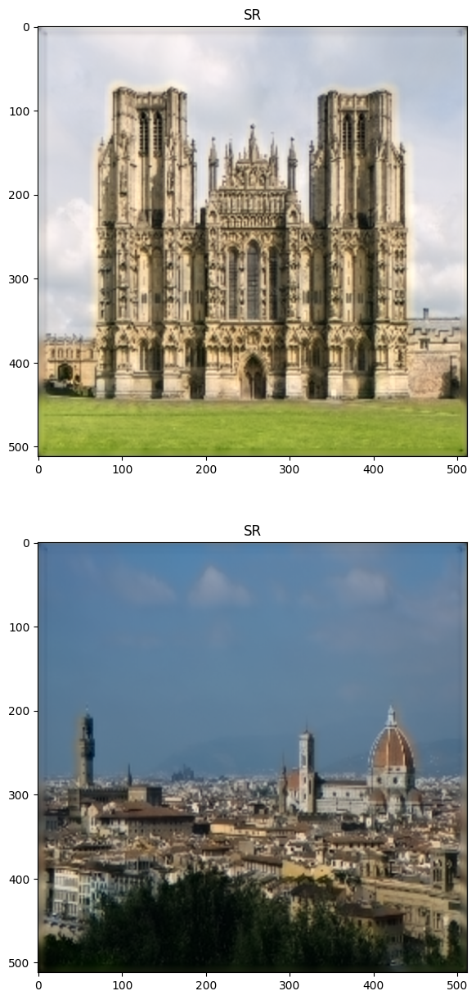

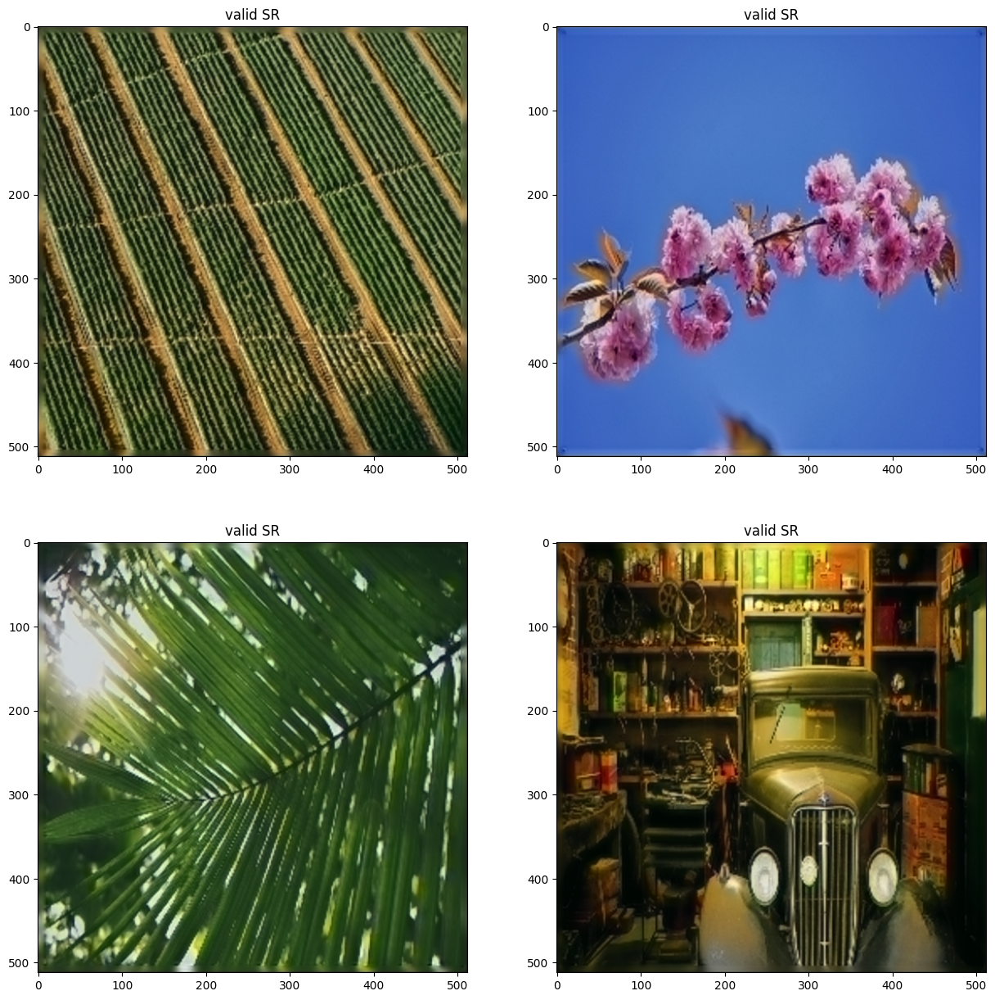

epochs:  75%|███████▌  | 75/100 [4:06:21<1:22:31, 198.05s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00078063 |          0.000229029 |      20.5303 |      20.5299 |  0.000729 | 0.000729 |


Epochs [76/ 100] 



epochs:  76%|███████▌  | 76/100 [4:09:36<1:18:50, 197.09s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000773402 |          0.000460943 |      20.5416 |      20.5429 |  0.000729 | 0.000729 |


Epochs [77/ 100] 



epochs:  77%|███████▋  | 77/100 [4:12:52<1:15:27, 196.84s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|       0.00075416 |          0.000191182 |      20.5548 |      20.5433 |  0.000729 | 0.000729 |


Epochs [78/ 100] 



epochs:  78%|███████▊  | 78/100 [4:16:09<1:12:13, 196.97s/it]

|   Gen Loss Train |   Discriminator Loss |   PSNR train |   PSNR valid |   Diss lr |   Gen lr |
|------------------|----------------------|--------------|--------------|-----------|----------|
|      0.000753611 |           0.00331921 |      20.5532 |      20.5542 |  0.000729 | 0.000729 |


Epochs [79/ 100] 



In [ ]:
train_srgan()